In [ ]:
!pip install MTCNN
!pip install face_recognition

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Shape of image/array: (2608, 4624, 3)


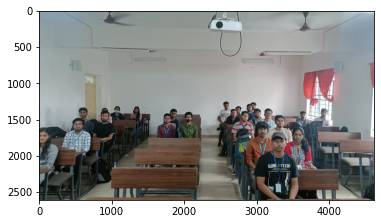

In [ ]:
import matplotlib.pyplot as plt
import mtcnn

# load image from file
filename = "/content/drive/MyDrive/Smart Roster - Data Collection (File responses)/TARP-Class-Image.jpg"
classIMG = plt.imread(filename)
print("Shape of image/array:",classIMG.shape)
imgplot = plt.imshow(classIMG)
plt.show()

7/7 [==============================] - 0s 3ms/step
[{'box': [3274, 1477, 97, 115], 'confidence': 0.9999998807907104, 'keypoints': {'left_eye': (3308, 1517), 'right_eye': (3357, 1520), 'nose': (3336, 1538), 'mouth_left': (3309, 1562), 'mouth_right': (3351, 1565)}}, {'box': [482, 1513, 112, 132], 'confidence': 0.9999997615814209, 'keypoints': {'left_eye': (513, 1565), 'right_eye': (564, 1564), 'nose': (535, 1588), 'mouth_left': (514, 1613), 'mouth_right': (558, 1613)}}, {'box': [3222, 1732, 174, 206], 'confidence': 0.9999996423721313, 'keypoints': {'left_eye': (3274, 1802), 'right_eye': (3354, 1799), 'nose': (3320, 1842), 'mouth_left': (3286, 1888), 'mouth_right': (3348, 1886)}}, {'box': [2809, 1413, 78, 104], 'confidence': 0.9999994039535522, 'keypoints': {'left_eye': (2837, 1448), 'right_eye': (2871, 1454), 'nose': (2855, 1468), 'mouth_left': (2833, 1486), 'mouth_right': (2863, 1491)}}, {'box': [1815, 1384, 72, 91], 'confidence': 0.9999985694885254, 'keypoints': {'left_eye': (1841, 141

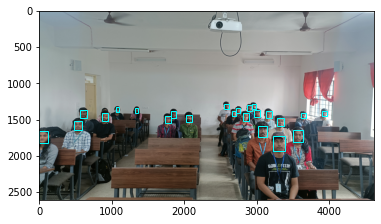

In [ ]:
# draw an image with detected objects
def draw_facebox(filename, result_list):
    # load the image
    data = plt.imread(filename)
    # plot the image
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    for result in result_list:
    # get coordinates
        x, y, width, height = result['box']
        # create the shape
        rect = plt.Rectangle((x, y), width, height, fill=False, color='cyan', linewidth = 1)
        # draw the box
        ax.add_patch(rect)
    # show the plot
    plt.show()

# detector is defined above, otherwise uncomment
detector = mtcnn.MTCNN()
# detect faces in the image
faces = detector.detect_faces(classIMG)

# for face in faces:
#   print(face["confidence"])

print(faces)
# display faces on the original image
draw_facebox(filename, faces)

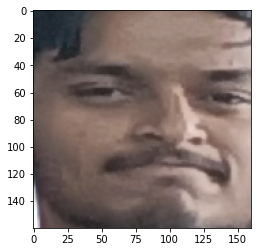

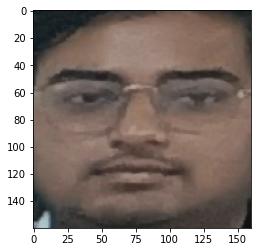

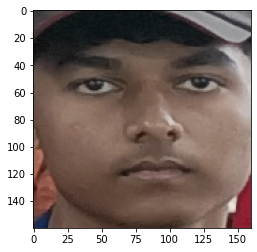

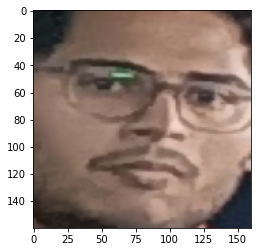

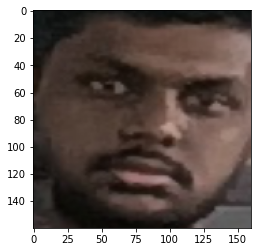

...

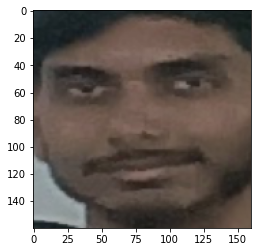

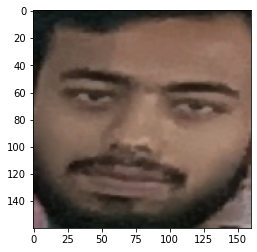

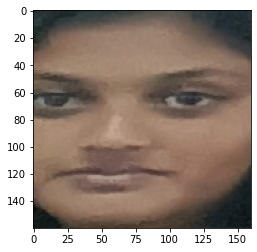

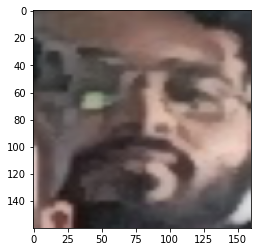

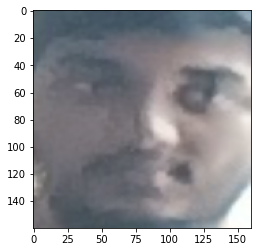

[array([-3.99176106e-02,  1.04916424e-01,  9.08227339e-02, -8.84721987e-03,
       -7.96068907e-02, -4.25217301e-02, -5.36882281e-02,  1.44641846e-04,
        1.27231881e-01, -3.24757695e-02,  2.32100487e-01, -1.46977641e-02,
       -2.44695663e-01, -2.86511779e-02, -3.50759923e-03,  9.97723192e-02,
       -1.42348200e-01, -6.62799031e-02, -1.05659127e-01, -1.17935047e-01,
        4.42959890e-02,  1.10016763e-02,  1.31568611e-02,  5.96399605e-03,
       -9.54174921e-02, -2.94010580e-01, -7.90115595e-02, -1.24613255e-01,
        9.03142169e-02, -1.82792127e-01,  1.03953332e-02,  2.96400040e-02,
       -1.19682901e-01, -3.76309752e-02, -1.84991509e-02,  2.24111676e-02,
        6.10543787e-03, -9.95675772e-02,  1.52938694e-01, -3.48061919e-02,
       -1.51466966e-01, -5.67450523e-02,  2.84636021e-03,  2.55620241e-01,
        1.80223763e-01,  4.06768024e-02,  1.90545432e-02, -5.35323620e-02,
        5.95808029e-02, -2.80593038e-01,  2.75827646e-02,  1.55837148e-01,
        1.87346376e-02, 

In [ ]:
# operates on the image of the class - test data - individual face
# get position and encodings of face
import cv2 as cv
face_locs = [] # position of face
encodings = [] # encodings of face
for face in faces:
  x, y, w, h = face['box']
  face_locs.append((x,y,w,h))
  img = cv.resize(classIMG[y:y+h, x:x+w], (160,160))
  encodings.append(face_recognition.face_encodings(classIMG[y:y+h, x:x+w], [(x,y,w,h)])[0])
  imgplot = plt.imshow(img)
  plt.show()

print(encodings)

In [ ]:
# operates on class image for face encodings of identified faces - test data - batch job

import face_recognition
class_encodings = []

encodings = face_recognition.face_encodings(classIMG, face_locs)

print(encodings)

[array([-0.04281226,  0.12996659,  0.0667058 , -0.00797697, -0.11270566,
       -0.04368501, -0.04969047, -0.02494707,  0.07586722, -0.03307115,
        0.2032305 , -0.00919952, -0.25227156, -0.0184731 ,  0.00586651,
        0.09994657, -0.1015307 , -0.06002684, -0.17410764, -0.11471002,
       -0.01305269,  0.05326615,  0.00999085, -0.01309056, -0.07982327,
       -0.2120306 , -0.06686807, -0.07255594,  0.10267482, -0.15633458,
        0.01249018,  0.0232777 , -0.19795185, -0.04597312,  0.01555356,
        0.03449349, -0.02016109, -0.07515892,  0.1451446 , -0.0222692 ,
       -0.15562719, -0.00864653,  0.02169823,  0.21880922,  0.24276222,
        0.01558404, -0.03374734, -0.08000037,  0.06028292, -0.25436532,
        0.01226653,  0.17325266,  0.07374401,  0.12618324,  0.03160296,
       -0.12919983,  0.04010883,  0.1213814 , -0.12304114,  0.02391748,
        0.04739274, -0.1234354 , -0.04266335, -0.10079233,  0.17086315,
        0.03738404, -0.09112653, -0.12831014,  0.13233626, -0.1

In [ ]:
# read + resize function

def img_resize(path):
  img = cv2.imread(path)
  (h, w) = img.shape[:2]
  width = 500
  ratio = width / float(w)
  height = int(h * ratio)
  #resizing the image with custom width and height
  return cv2.resize(img, (width, height))

In [ ]:
# training data - individual face face encodings
import cv2
import os
training_images = 'train'
train_face_encs = []
train_face_names = []
for filename in os.listdir("/content/drive/MyDrive/Smart Roster - Data Collection (File responses)/dataset"):
  img = cv2.imread("/content/drive/MyDrive/Smart Roster - Data Collection (File responses)/dataset/" + filename)
  img = cv.resize(img, (160,160))
  train_face_encs.append(face_recognition.face_encodings(img, [(0, 160, 160, 0)])[0])
  train_face_names.append(filename.split('.')[0])
print(train_face_encs)

[array([-5.89959472e-02,  3.64641920e-02, -1.45681202e-04, -4.67452705e-02,
        3.18431407e-02, -1.19448796e-01,  2.49870941e-02, -1.44371480e-01,
        1.31851107e-01, -5.24409935e-02,  2.53731102e-01, -2.22015455e-02,
       -1.95569605e-01, -1.52016908e-01,  3.89825180e-02,  1.44545197e-01,
       -1.95480764e-01, -1.13811642e-01, -1.49926811e-01, -7.00389221e-02,
       -4.21677083e-02, -2.30382886e-02,  8.86517614e-02,  3.88662964e-02,
       -1.09512657e-01, -2.89400935e-01, -9.21876505e-02, -1.70959264e-01,
        5.23536354e-02, -1.02339983e-02,  3.43177021e-02,  1.42338187e-01,
       -1.79691330e-01, -3.37080657e-02,  7.82466829e-02,  6.26920313e-02,
        2.09084228e-02, -4.77792621e-02,  2.20282629e-01, -1.44663267e-02,
       -1.53094977e-01, -3.70483398e-02,  2.73808092e-02,  2.40725726e-01,
        2.11005762e-01, -2.21791267e-02, -1.71060525e-02, -4.68827486e-02,
        6.30335510e-02, -2.34947652e-01, -2.55751573e-02,  1.25449270e-01,
        7.93642923e-02, 

[False, False, True, False, True, True, True, True, False, True, True, False, True, True]
[0.62416411 0.65841902 0.37283152 0.67878364 0.59512224 0.44082925
 0.5364777  0.47240874 0.61485915 0.48157994 0.55137916 0.61423532
 0.50860065 0.59888283]
GOPI_S
[False, False, True, False, True, True, True, True, False, True, True, False, True, True]
[0.62416411 0.65841902 0.37283152 0.67878364 0.59512224 0.44082925
 0.5364777  0.47240874 0.61485915 0.48157994 0.55137916 0.61423532
 0.50860065 0.59888283]
GOPI_S
[False, False, True, False, True, True, True, True, False, True, True, False, True, True]
[0.62416411 0.65841902 0.37283152 0.67878364 0.59512224 0.44082925
 0.5364777  0.47240874 0.61485915 0.48157994 0.55137916 0.61423532
 0.50860065 0.59888283]
GOPI_S
[False, False, True, False, True, True, True, True, False, True, True, False, True, True]
[0.62416411 0.65841902 0.37283152 0.67878364 0.59512224 0.44082925
 0.5364777  0.47240874 0.61485915 0.48157994 0.55137916 0.61423532
 0.50860065

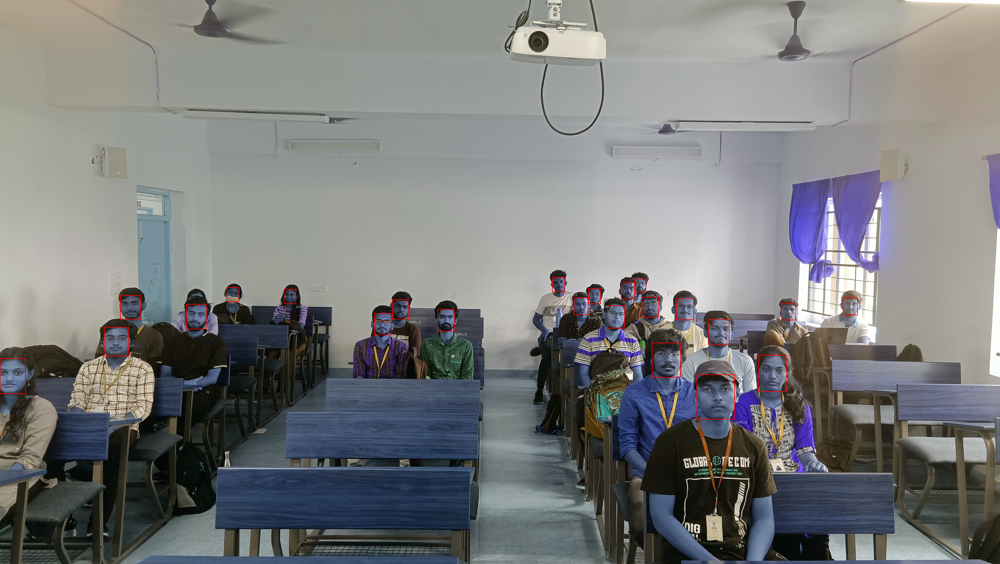

In [ ]:
import numpy as np
from google.colab.patches import cv2_imshow
# for file in os.listdir(testing_images):
face_names_recog = []
for face_enc in encodings:
  face_matches = face_recognition.compare_faces(train_face_encs, face_enc)
  face_distances = face_recognition.face_distance(train_face_encs, face_enc)
  best_match_index = np.argmin(face_distances)
  face_name_recog = "unknown"
  print(face_matches)
  print(face_distances)
  print(train_face_names[best_match_index])
  if face_matches[best_match_index]:
    face_name_recog = train_face_names[best_match_index]
  face_names_recog.append(face_name_recog)

tempClassImg = classIMG

for (x, y, w, h), face_name in zip(face_locs, face_names_recog):
  cv2.rectangle(tempClassImg, (x, y), (x+w, y+h), (0, 0, 255), 2)
  cv2.putText(tempClassImg, face_name, (x+w+2, y+h+20), cv2. FONT_HERSHEY_PLAIN, 1, (255, 255, 255), 1)
cv2_imshow(tempClassImg)


# Manual checking for most similar face encoding

# for face_enc in encodings:
#   enc_dist_val = []
#   for index, train_enc in enumerate(train_face_encs):
#     enc_dist_val.append(sum(face_enc - train_enc))
#     # if sum(face_enc - train_enc) < minDistEncVal:
#     #   label = train_face_names[index]
#   minEncDiffVal = min(enc_dist_val, key=abs)
#   label = train_face_names[enc_dist_val.index(minEncDiffVal)]
#   # print(label)
#   face_names_recog.append(label) 

# tempClassImg = classIMG

# for (x, y, w, h), face_name in zip(face_locs, face_names_recog):
#   cv2.rectangle(tempClassImg, (x, y), (x+w, y+h), (0, 0, 255), 2)
#   cv2.putText(tempClassImg, face_name, (x+w+2, y+h+20), cv2. FONT_HERSHEY_PLAIN, 1, (255, 255, 255), 1)
# cv2_imshow(tempClassImg)

In [ ]:
!pip install MTCNN

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 18.0 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import matplotlib.pyplot as plt
import mtcnn
import os
import numpy as np
import cv2 as cv
import tensorflow as tf

from mtcnn.mtcnn import MTCNN
detector = MTCNN()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
class FACELOADING:
    def __init__(self, directory):
        self.directory = directory
        self.target_size = (160,160)
        self.X = []
        self.Y = []
        self.detector = MTCNN()
    

    def extract_face(self, filename):
        img = cv.imread(filename)
        print(img)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        x,y,w,h = self.detector.detect_faces(img)[0]['box']
        x,y = abs(x), abs(y)
        face = img[y:y+h, x:x+w]
        face_arr = cv.resize(face, self.target_size)
        return face_arr
    

    def load_faces(self, dir):
        FACES = []
        # print(os.listdir(dir))
        for im_name in os.listdir(dir):
            try:
                path = dir + im_name
                # print(path)
                single_face = self.extract_face(path)
                FACES.append(single_face)
            except Exception as e:
                pass
        return FACES

    def load_classes(self):
        for sub_dir in os.listdir(self.directory):
            path = self.directory +'/'+ sub_dir+'/'
            # print(path)
            FACES = self.load_faces(path)
            labels = [sub_dir for _ in range(len(FACES))]
            print(f"Loaded successfully: {len(labels)}")
            self.X.extend(FACES)
            self.Y.extend(labels)
        
        return np.asarray(self.X), np.asarray(self.Y)


    def plot_images(self):
        plt.figure(figsize=(18,16))
        for num,image in enumerate(self.X):
            ncols = 3
            nrows = len(self.Y)//ncols + 1
            plt.subplot(nrows,ncols,num+1)
            plt.imshow(image)
            plt.axis('off')

In [ ]:
faceloading = FACELOADING("/content/drive/MyDrive/Smart Roster - Data Collection (File responses)/dataset")
X, Y = faceloading.load_classes()

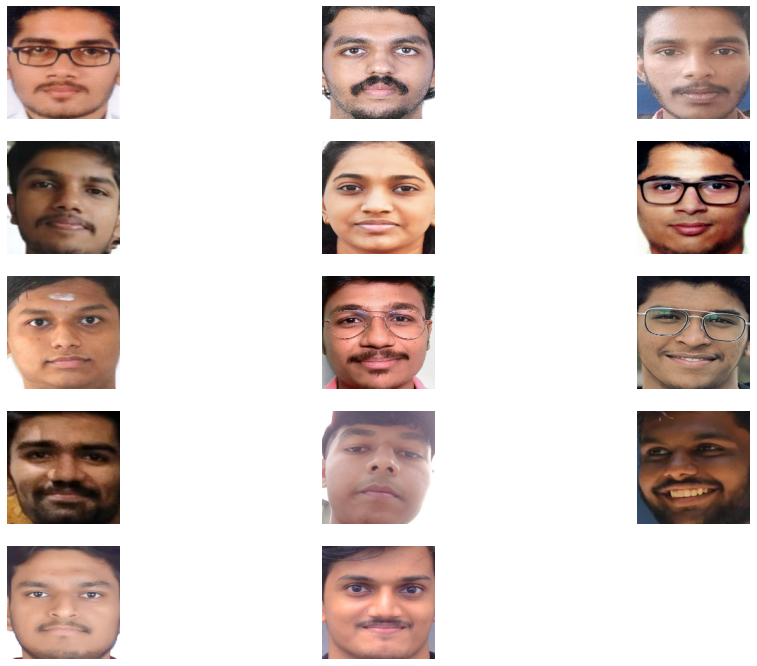

In [ ]:
plt.figure(figsize=(16,12))
for num,image in enumerate(X):
    ncols = 3
    nrows = len(Y)//ncols + 1
    plt.subplot(nrows,ncols,num+1)
    plt.imshow(image)
    plt.axis('off')

In [ ]:
!pip install keras-facenet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for keras-facenet: filename=keras_facenet-0.3.2-py3-none-any.whl size=10385 sha256=f649f6113d9ee5df6f24623c34867fde6de90c3ede7a12ccdfc11bb99ef682e6
  Stored in directory: /root/.cache/pip/wheels/73/5d/41/90b5d28ca667cfc4748ae859fa4f0b85b936d73207a073ded5
Successfully built keras-facenet


In [ ]:
from keras_facenet import FaceNet
embedder = FaceNet()

def get_embedding(face_img):
    face_img = face_img.astype('float32') # 3D(160x160x3)
    face_img = np.expand_dims(face_img, axis=0) 
    # 4D (Nonex160x160x3)
    yhat= embedder.embeddings(face_img)
    return yhat[0] # 512D image (1x1x512)

In [ ]:
EMBEDDED_X = []

for img in X:
    EMBEDDED_X.append(get_embedding(img))

EMBEDDED_X = np.asarray(EMBEDDED_X)

1/1 [==============================] - 0s 114ms/step


In [ ]:
from sklearn.preprocessing import LabelEncoder

encoder = LabelEncoder()
encoder.fit(Y)
Y = encoder.transform(Y)

In [ ]:
# from sklearn.model_selection import train_test_split

# X_train, X_test, Y_train, Y_test = train_test_split(EMBEDDED_X, Y, shuffle=True, random_state=17)

In [ ]:
from sklearn.svm import SVC
model = SVC(kernel='linear', probability=True)
model.fit(EMBEDDED_X, Y)

SVC(kernel='linear', probability=True)

In [ ]:
ypreds_train = model.predict(X_train)
ypreds_test = model.predict(X_test)

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(Y_train, ypreds_train)

1.0

In [ ]:
accuracy_score(Y_test,ypreds_test)

0.0

In [ ]:
t_im = cv.imread("/content/drive/MyDrive/Smart Roster - Data Collection (File responses)/TARP-Class-Image.jpg")
t_im = cv.cvtColor(t_im, cv.COLOR_BGR2RGB)
x,y,w,h = detector.detect_faces(t_im)[0]['box']

7/7 [==============================] - 0s 37ms/step


In [ ]:
t_im = t_im[y:y+h, x:x+w]
t_im = cv.resize(t_im, (160,160))
test_im = get_embedding(t_im)

1/1 [==============================] - 0s 101ms/step


In [ ]:
test_im = [test_im]
ypreds = model.predict(test_im)

In [ ]:
ypreds

array([8])

In [ ]:
encoder.inverse_transform(ypreds)

array(['MOHAMED_ASHRAF_ALI'], dtype='<U22')

In [ ]:
from google.colab.patches import cv2_imshow
for face in X:
  print(np.array(face).shape)
  test_im = get_embedding(t_im)
  test_im = [test_im]
  ypreds = model.predict(test_im)
  print(encoder.inverse_transform(ypreds))

(160, 160, 3)
1/1 [==============================] - 0s 177ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 106ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 99ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 115ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 101ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 105ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 114ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 107ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 113ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 98ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 97ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 108ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 104ms/step
[8]
(160, 160, 3)
1/1 [==============================] - 0s 107ms/step
[8]
